## loading Data

In [1]:
!wget https://raw.githubusercontent.com/duybluemind1988/PyTorch-Computer-Vision-Cookbook/master/Chapter08/content.jpg
!wget https://raw.githubusercontent.com/duybluemind1988/PyTorch-Computer-Vision-Cookbook/master/Chapter08/style.jpg

--2020-10-15 01:55:48--  https://raw.githubusercontent.com/duybluemind1988/PyTorch-Computer-Vision-Cookbook/master/Chapter08/content.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2643910 (2.5M) [image/jpeg]
Saving to: ‘content.jpg’

content.jpg         100%[===================>]   2.52M  --.-KB/s    in 0.09s   

2020-10-15 01:55:49 (28.9 MB/s) - ‘content.jpg’ saved [2643910/2643910]

--2020-10-15 01:55:49--  https://raw.githubusercontent.com/duybluemind1988/PyTorch-Computer-Vision-Cookbook/master/Chapter08/style.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiti

In step 1, we loaded the content and style images as PIL objects. We used the two images
that were provided with the scripts of this chapter. However, you can replace them with
your own content and style images. Make sure to copy the images into a folder named
data in the same location as your scripts.

In [2]:
from PIL import Image
#path2content= "./data/content.jpg"
path2content='/content/content.jpg'
#path2style= "./data/style.jpg"
path2style='/content/style.jpg'
content_img = Image.open(path2content)
style_img = Image.open(path2style)

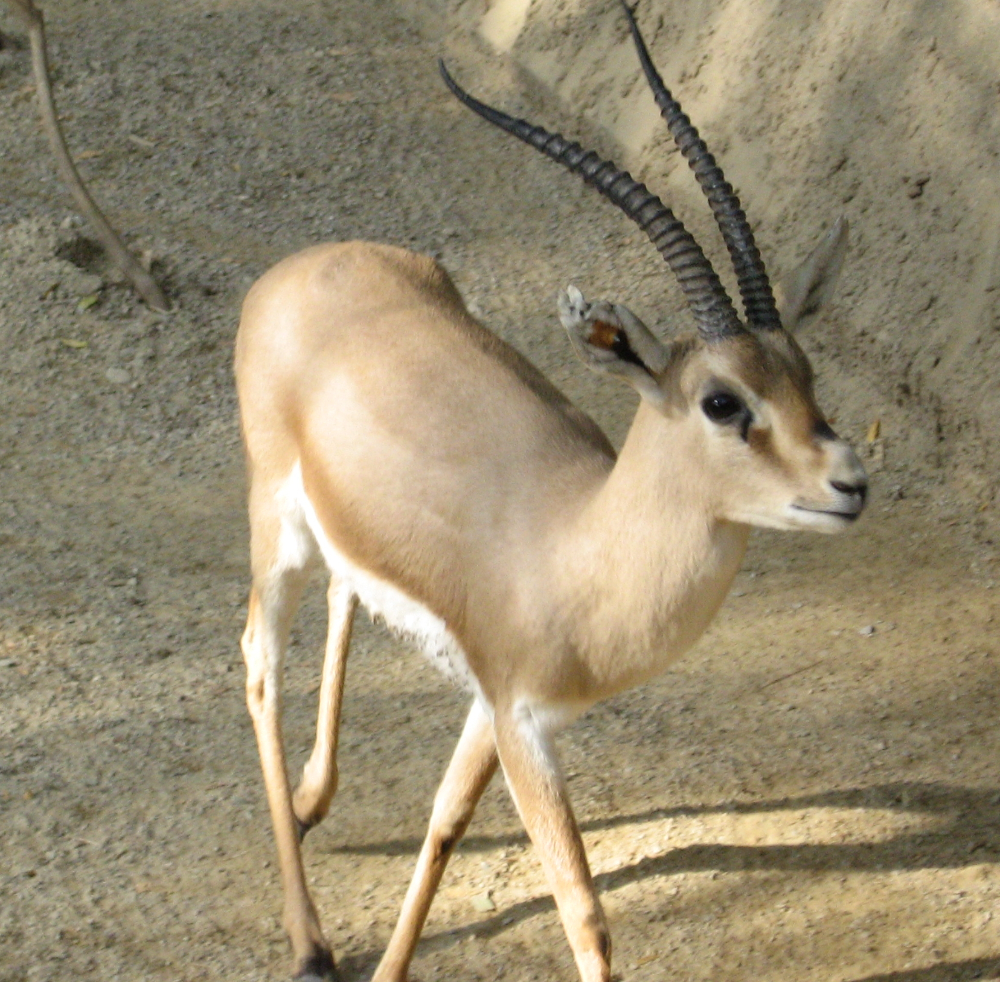

In [3]:
content_img

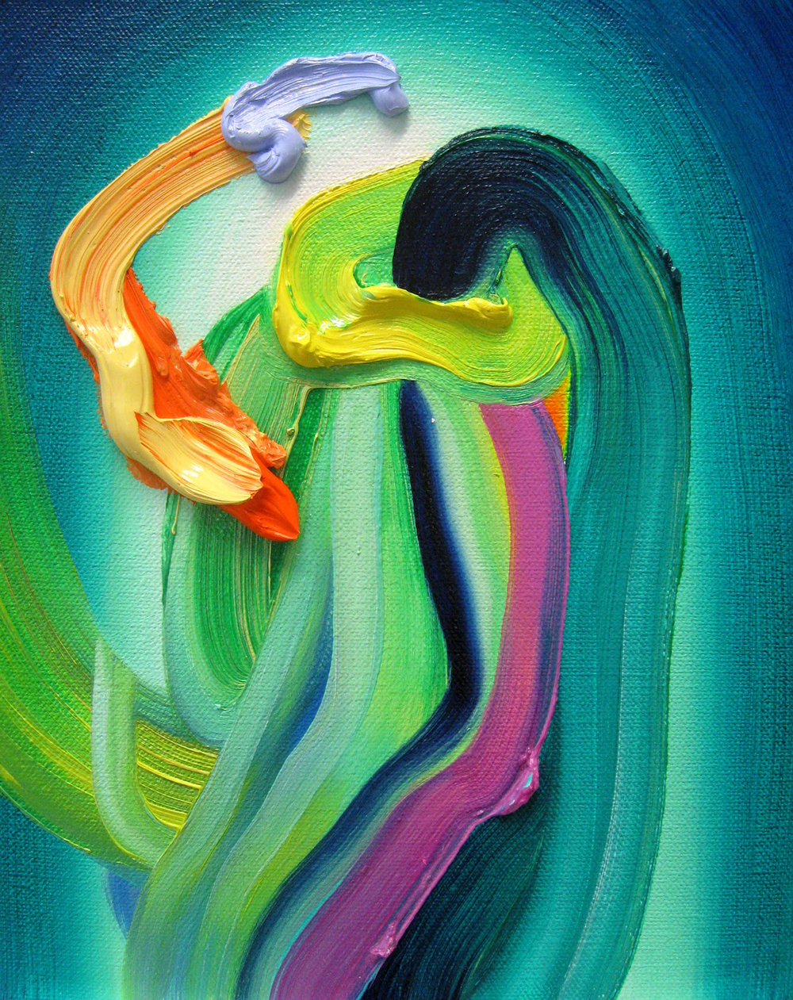

In [4]:
style_img

In step 2, we transformed the content and style images into tensors. To this end, we applied
three transformations from the torchvision.transforms package: Resize, ToTensor,
and Normalize.

In [5]:
import torchvision.transforms as transforms

h, w = 256, 384 
mean_rgb = (0.485, 0.456, 0.406)
std_rgb = (0.229, 0.224, 0.225)

transformer = transforms.Compose([
                    transforms.Resize((h,w)),  
                    transforms.ToTensor(),
                    transforms.Normalize(mean_rgb, std_rgb)])  

In step 3, we used the transformation function defined in step 2 to convert the content and
style images to normalized tensors. Check out the tensor shape. As you can see, images
were resized and reshaped into tensors of shape [3, 256, 384]. Also, check out
the requires_grad attribute of the tensors. Since no optimization is applied to the content
and style images, this attribute should be False.

In [6]:
content_tensor = transformer(content_img)
print(content_tensor.shape, content_tensor.requires_grad)

torch.Size([3, 256, 384]) False


In [7]:
style_tensor = transformer(style_img)
print(style_tensor.shape, style_tensor.requires_grad)

torch.Size([3, 256, 384]) False


In [8]:
input_tensor = content_tensor.clone().requires_grad_(True)
print(input_tensor.shape, input_tensor.requires_grad)

torch.Size([3, 256, 384]) True


In step 4, we displayed the content and style tensors. To be able to visualize the tensors, we
defined the imgtensor2pil helper function to convert the tensors back to PIL images.
Note that this helper function was defined for visualization purposes only. The input to the
helper function is as follows:

In the function, we first cloned the tensor to prevent making any changes to the original
tensor. Since the tensor was previously normalized using the zero-mean-unit-variance
normalization method, we renormalized it back to its original values. This was done by
multiplying its values by the RGB standard deviation and then adding the RGB mean of the
ImageNet dataset. Next, we made sure that the values are in the range [0, 1] by using
the .clamp() method. Finally, the tensor is converted to a PIL image using
the to_pil_image function from the torchvision package

In [9]:
import torch

def imgtensor2pil(img_tensor):
    img_tensor_c = img_tensor.clone().detach()
    img_tensor_c*=torch.tensor(std_rgb).view(3, 1,1)
    img_tensor_c+=torch.tensor(mean_rgb).view(3, 1,1)
    img_tensor_c = img_tensor_c.clamp(0,1)
    img_pil=to_pil_image(img_tensor_c)
    return img_pil

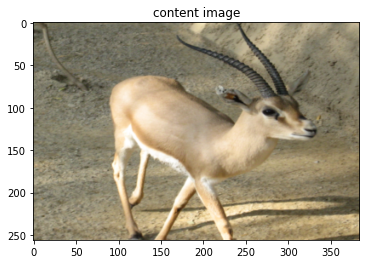

In [10]:
import matplotlib.pylab as plt
%matplotlib inline
from torchvision.transforms.functional import to_pil_image

plt.imshow(imgtensor2pil(content_tensor))
plt.title("content image");

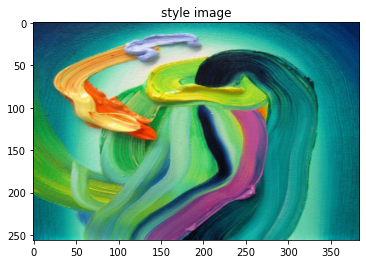

In [11]:
plt.imshow(imgtensor2pil(style_tensor))
plt.title("style image");

# Implementing neural style transfer

As you have seen throughout this book, we have followed a few standard steps: we loaded
the input and target data, defined a model, an objective function and optimizer, and then
trained the model by updating the model parameters using the gradient-descent algorithm.
In all of these past cases, the input to the model was kept unchanged during the training
process and the model was updated.

Specifically, the neural style transfer algorithm works as follows:
1. Take a pretrained classification model (for example, VGG19), remove the last
layers, and keep the remaining layers to serve as a feature extractor.
2. Feed the content image to the model and get selected features to serve as the
target content.
3. Feed the style image to the model and get the Gram matrix of selected features to
serve as the target style.
4. Feed the input to the model and get the features and the Gram matrix of selected
features to serve as the predicted content and style, respectively.
5. Compute the content and style errors, and use this information to update the
input and reduce the error.
6. Repeat step 4 until the error is minimized.

In the Loading the pretrained model sub-section, we loaded a pretrained model to be used as
the feature extractor.
As was observed in step 1, we used the VGG19 model from the torchvision package
pretrained on the ImageNet dataset. The model expects the input to be mini-batches of
shape (3, Height, Width) and normalized. This is why we transformed the content and
style images in the Loading the data section.

In [16]:
torch.cuda.is_available()

True

In [23]:
import torchvision.models as models

device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
#device='cpu'
model_vgg = models.vgg19(pretrained=True).features.to(device).eval()
#model_vgg = models.vgg19(pretrained=True).features.to('cpu').eval() # will run this code

'''
In step 2, we froze the model parameters using the requires_grad_ method to avoid any
changes to the model during the algorithm optimization.
'''
for param in model_vgg.parameters():
    param.requires_grad_(False)   
print(model_vgg)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

# Defining loss function

In step 1, we defined the get_features helper function. This helper function was
developed to get the intermediate features of the pretrained model. These features will be
used in calculating the style and content loss values. The inputs to the helper function are
as follows:

In the helper function, we iterated over the model layers and passed the input tensor x to
each layer and obtained its output. If the layer name is included in the layers dictionary,
we collected its output. The helper function returns the collected features as a dictionary

In [18]:
def get_features(x, model, layers):
    features = {}
    for name, layer in enumerate(model.children()):
        x = layer(x)
        if str(name) in layers:
            features[layers[str(name)]] = x
    return features

In step 2, we defined the gram_matrix helper function to compute the Gram matrix of a
tensor. The Gram matrix will be used to calculate the style loss value. The function input is
as follows:

x: A tensor of shape [1, c, h, w], where c, h, w are the number of channels,
height, and width of x

In [19]:
def gram_matrix(x):
    n, c, h, w = x.size()
    x = x.view(n*c, h * w)
    gram = torch.mm(x, x.t())
    return gram

In step 3, we defined the get_content_loss helper function to compute the content loss
value. The inputs to the helper function are as follows:

Like any typical loss function, here, we want to compute the distance between the target
and predicted values. In the helper function, we extracted the target and predicted tensors
for the layer specified by the argument layer. Then, we calculated the mean squared error
(MSE) between the two tensors and returned its value.

In [20]:
import torch.nn.functional as F

def get_content_loss(pred_features, target_features, layer):
    target= target_features[layer]
    pred = pred_features [layer]
    loss = F.mse_loss(pred, target)
    return loss

In step 4, we defined the get_style_loss helper function to compute the style loss. The
inputs to the helper function are as follows:

In [21]:
def get_style_loss(pred_features, target_features, style_layers_dict):  
    loss = 0
    for layer in style_layers_dict:
        pred_fea = pred_features[layer]
        pred_gram = gram_matrix(pred_fea)
        n, c, h, w = pred_fea.shape
        target_gram = gram_matrix (target_features[layer])
        layer_loss = style_layers_dict[layer] *  F.mse_loss(pred_gram, target_gram)
        loss += layer_loss/ (n* c * h * w)
    return loss

In [24]:
feature_layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '21': 'conv4_2',  
                  '28': 'conv5_1'}

con_tensor = content_tensor.unsqueeze(0).to(device)
sty_tensor = style_tensor.unsqueeze(0).to(device)

content_features = get_features(con_tensor, model_vgg, feature_layers)
style_features = get_features(sty_tensor, model_vgg, feature_layers)

In [25]:
for key in content_features.keys():
    print(content_features[key].shape)

torch.Size([1, 64, 256, 384])
torch.Size([1, 128, 128, 192])
torch.Size([1, 256, 64, 96])
torch.Size([1, 512, 32, 48])
torch.Size([1, 512, 32, 48])
torch.Size([1, 512, 16, 24])


In [26]:
from torch import optim

input_tensor = con_tensor.clone().requires_grad_(True)
optimizer = optim.Adam([input_tensor], lr=0.01)

In [ ]:
num_epochs = 300
content_weight = 1e1
style_weight = 1e4
content_layer = "conv5_1"
style_layers_dict = { 'conv1_1': 0.75,
                      'conv2_1': 0.5,
                      'conv3_1': 0.25,
                      'conv4_1': 0.25,
                      'conv5_1': 0.25}

for epoch in range(num_epochs+1):
    optimizer.zero_grad()
    input_features = get_features(input_tensor, model_vgg, feature_layers)
    content_loss = get_content_loss (input_features, content_features, content_layer)
    style_loss = get_style_loss(input_features, style_features, style_layers_dict)
    neural_loss = content_weight * content_loss + style_weight * style_loss
    neural_loss.backward(retain_graph=True)
    optimizer.step()
    
    if epoch % 100 == 0:
        print('epoch {}, content loss: {:.2}, style loss {:.2}'.format(
          epoch,content_loss, style_loss))


In [ ]:
plt.imshow(imgtensor2pil(input_tensor[0].cpu()));